<a href="https://colab.research.google.com/github/zey-o/DeepLearning_Wikiart_Emotions/blob/main/6_binary_positive_neg.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [111]:
import pandas as pd
import numpy as np

import pathlib
import matplotlib.pyplot as plt

from glob import glob
import os

from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Dense, Conv2D, MaxPool2D, Flatten, Dropout, Activation
from tensorflow.keras import regularizers

from tensorflow.keras.applications import mobilenet_v2
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ReduceLROnPlateau

from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import InputLayer

We'll first load the datasets as well as the images. For this 'binary' model, we will be trying to predict whether an artwork evokes 'positive' or 'negative' images as attributed by the authors of the study. 
1. Check & Load Data: We will first set the parameters of the modeling that we will be doing. 
2. Modeling: In this section we will try out a baseline model and then do transfer learning and data augmentation to come up with a final model. 
3. Predictions: Predict classes & check with the images assigned the predictions. 

## Check & Load Data from Directory

In [32]:
data_dir = pathlib.Path("drive/MyDrive/DL/dataset_images")

In [33]:
image_count = len(list(data_dir.glob('**/*.png')))
print(image_count)

4119


In [34]:
df = pd.read_csv("drive/MyDrive/DL/path_prob.csv")

In [35]:
df.head(3)

,Unnamed: 0,ID,emotion,path
0,0,58c6237dedc2c9c7dc0de1ae,happiness,dataset_images/58c6237dedc2c9c7dc0de1ae.png
1,1,577280dfedc2cb3880f28e76,anticipation,dataset_images/577280dfedc2cb3880f28e76.png
2,2,57727f2dedc2cb3880ed5fa9,happiness,dataset_images/57727f2dedc2cb3880ed5fa9.png


In [36]:
df.path = "drive/MyDrive/DL/" + df.path
df.head(3)

,Unnamed: 0,ID,emotion,path
0,0,58c6237dedc2c9c7dc0de1ae,happiness,drive/MyDrive/DL/dataset_images/58c6237dedc2c9...
1,1,577280dfedc2cb3880f28e76,anticipation,drive/MyDrive/DL/dataset_images/577280dfedc2cb...
2,2,57727f2dedc2cb3880ed5fa9,happiness,drive/MyDrive/DL/dataset_images/57727f2dedc2cb...


In [37]:
df.emotion.value_counts()

happiness           1102
surprise             822
anticipation         520
trust                478
fear                 358
sadness              226
humility             184
love                 114
disgust              101
optimism              62
arrogance             52
anger                 36
gratitude             14
pessimism             10
disagreeableness       7
shame                  7
neutral                5
agreeableness          5
shyness                2
Name: emotion, dtype: int64

For this binary problem, we will tackle with identifying positive and negative emotions as per the description given by the authors of this study. 

In [38]:
positive_emotions = ['gratitude', 'happiness', 'humility', 'love', 'optimism', 'trust']
negative_emotions = ['anger', 'arrogance', 'disgust', 'fear', 'pessimism', 'regret', 'sadness', 'shame']

In [39]:
df["emotion"] = df.emotion.apply(lambda x: "positive" if (x in positive_emotions) \
                                 else ("negative" if x in negative_emotions else x))
df.head(5)

,Unnamed: 0,ID,emotion,path
0,0,58c6237dedc2c9c7dc0de1ae,positive,drive/MyDrive/DL/dataset_images/58c6237dedc2c9...
1,1,577280dfedc2cb3880f28e76,anticipation,drive/MyDrive/DL/dataset_images/577280dfedc2cb...
2,2,57727f2dedc2cb3880ed5fa9,positive,drive/MyDrive/DL/dataset_images/57727f2dedc2cb...
3,3,58d1240cedc2c94f900fc610,negative,drive/MyDrive/DL/dataset_images/58d1240cedc2c9...
4,4,57727de7edc2cb3880e91f26,positive,drive/MyDrive/DL/dataset_images/57727de7edc2cb...


In [40]:
df.emotion.value_counts()

positive            1954
surprise             822
negative             790
anticipation         520
disagreeableness       7
agreeableness          5
neutral                5
shyness                2
Name: emotion, dtype: int64

OK, great! We do have a bit of a class imbalance here between positive and negative emotions. We're going to drop all the 'neutral' emotions for this binary classification model we will do but a note that 'surprise' (a neutral emotion as per the authors of the study) shows up more than all negative emotions combined. 

In [42]:
pos_neg_df = df[(df.emotion == "positive") | (df.emotion == "negative")]
pos_neg_df

,Unnamed: 0,ID,emotion,path
0,0,58c6237dedc2c9c7dc0de1ae,positive,drive/MyDrive/DL/dataset_images/58c6237dedc2c9...
2,2,57727f2dedc2cb3880ed5fa9,positive,drive/MyDrive/DL/dataset_images/57727f2dedc2cb...
3,3,58d1240cedc2c94f900fc610,negative,drive/MyDrive/DL/dataset_images/58d1240cedc2c9...
4,4,57727de7edc2cb3880e91f26,positive,drive/MyDrive/DL/dataset_images/57727de7edc2cb...
5,5,57728297edc2cb3880f81f5b,positive,drive/MyDrive/DL/dataset_images/57728297edc2cb...
...,...,...,...,...
4098,4098,577281c3edc2cb3880f59182,positive,drive/MyDrive/DL/dataset_images/577281c3edc2cb...
4099,4099,577280fcedc2cb3880f30eb1,negative,drive/MyDrive/DL/dataset_images/577280fcedc2cb...
4101,4101,57728001edc2cb3880efddcf,negative,drive/MyDrive/DL/dataset_images/57728001edc2cb...
4103,4103,57728412edc2cb3880fc9ff4,positive,drive/MyDrive/DL/dataset_images/57728412edc2cb...


In [43]:
pos_neg_df.emotion.value_counts()

positive    1954
negative     790
Name: emotion, dtype: int64

In [44]:
image_count = len(pos_neg_df)
image_count

2744

## Modeling 

We will first set parameters and then run the following models: 
1. Baseline 
2. Transfer Learning with MobileNet & Data Augmentation 
3. Transfer Learning with Data Augmentation Getting Rid of Dense Layers but adding more Dropouts & Regularization in the Layers
4. Back to Convolutions
5. Data Augmentation (with the Convolutions) 

In the end the 2nd model is the one that gets the highest accuracy with around 0.698.

### Set parameters

Let's set some of the parameters we will be using. 

- The image size we will resize all images to at the beginning of our training process. 
- We will set the number of epochs to a certain number so that we can keep tweaking it later. 
- Batch size will be 32. 
- The emotions we will be working with. 
- We will split the data into 3: train - validation - test (60% - 20% - 20%) 

In [45]:
img_height = 180
img_width = 180

In [46]:
epochs = 100
batch_size = 32

In [47]:
val_set_start = int((6)*image_count//10)
test_set_start = int(8*image_count//10)

In [48]:
datagen=ImageDataGenerator(rescale=1./255.)
test_datagen=ImageDataGenerator(rescale=1./255.)

train_generator=datagen.flow_from_dataframe(
                                        dataframe = pos_neg_df[:val_set_start],
                                        x_col = "path",
                                        y_col = "emotion",
                                        batch_size = 32,
                                        interpolation = 'bilinear',
                                        seed = 42,
                                        shuffle = True,
                                        class_mode = "binary",
                                        target_size = (img_height, img_width))

valid_generator=test_datagen.flow_from_dataframe(
                                            dataframe = pos_neg_df[(val_set_start):(test_set_start)],
                                            x_col = "path",
                                            y_col = "emotion",
                                            batch_size = 32,
                                            # # interpolation = 'bilinear',
                                            # seed = 42,
                                            shuffle = False,
                                            class_mode = "binary",
                                            target_size = (img_height, img_width))

test_generator=test_datagen.flow_from_dataframe(
                                            dataframe = pos_neg_df[test_set_start:],
                                            x_col = "path",
                                            y_col = "emotion",
                                            batch_size = 32,
                                            interpolation = 'bilinear',
                                            seed = 42,
                                            shuffle = False,
                                            class_mode = "binary",
                                            target_size = (img_height, img_width))

Found 1646 validated image filenames belonging to 2 classes.
Found 549 validated image filenames belonging to 2 classes.
Found 549 validated image filenames belonging to 2 classes.


In [49]:
class_names = train_generator.class_indices
print(class_names)

{'negative': 0, 'positive': 1}


In [50]:
images, labels = next(train_generator)
print(images.dtype, images.shape)
print(labels.dtype, labels.shape)

float32 (32, 180, 180, 3)
float32 (32,)


In [51]:
STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
STEP_SIZE_VALID=valid_generator.n//valid_generator.batch_size
STEP_SIZE_TEST=test_generator.n//test_generator.batch_size


### 1. Baseline

Let's start with the same baseline we have been using and we will go from there. Order of business: create Sequantial layers with 1 set of hidden layer, compile and then fit model & lastly plot history.

In [56]:
model_pn_baseline = Sequential([
    layers.InputLayer(input_shape=(img_height, img_width,3)),
    layers.Dense(units = 20, activation = 'relu'), 
    layers.Flatten(),
    layers.Dense(units = 1, activation = 'sigmoid') 
])

In [57]:
model_pn_baseline.compile(optimizer='adam',loss="binary_crossentropy",metrics=["accuracy"])
model_pn_baseline.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 180, 180, 20)      80        
                                                                 
 flatten_1 (Flatten)         (None, 648000)            0         
                                                                 
 dense_3 (Dense)             (None, 1)                 648001    
                                                                 
Total params: 648,081
Trainable params: 648,081
Non-trainable params: 0
_________________________________________________________________


In [58]:
history_pn_baseline = model_pn_baseline.fit(train_generator,
                    # steps_per_epoch=STEP_SIZE_TRAIN,
                    steps_per_epoch = 25, 
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=epochs,
                    callbacks = EarlyStopping(monitor='val_loss', \
                                              mode='min', verbose=1, patience = 8,\
                                             restore_best_weights=True)
)

Epoch 1/100
25/25 [==============================] - 1133s 46s/step - loss: 2.9026 - accuracy: 0.5838 - val_loss: 0.9561 - val_accuracy: 0.5974
Epoch 2/100
25/25 [==============================] - 351s 14s/step - loss: 0.9127 - accuracy: 0.6752 - val_loss: 0.7957 - val_accuracy: 0.6195
Epoch 3/100
25/25 [==============================] - 191s 8s/step - loss: 0.7303 - accuracy: 0.6837 - val_loss: 0.8994 - val_accuracy: 0.7004
Epoch 4/100
25/25 [==============================] - 121s 5s/step - loss: 0.9742 - accuracy: 0.6562 - val_loss: 0.8659 - val_accuracy: 0.6691
Epoch 5/100
25/25 [==============================] - 72s 3s/step - loss: 1.0560 - accuracy: 0.6854 - val_loss: 2.7069 - val_accuracy: 0.3566
Epoch 6/100
25/25 [==============================] - 55s 2s/step - loss: 1.1401 - accuracy: 0.6969 - val_loss: 0.8168 - val_accuracy: 0.6654
Epoch 7/100
25/25 [==============================] - 43s 2s/step - loss: 0.7018 - accuracy: 0.7125 - val_loss: 0.8733 - val_accuracy: 0.6158
Epoch 

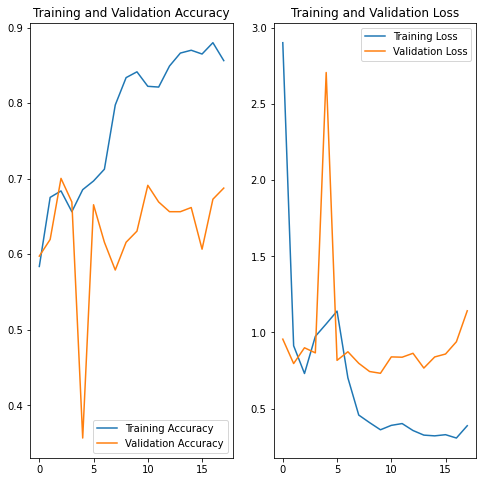

In [59]:
number_of_epochs_it_ran = len(history_pn_baseline.history['loss'])

acc = history_pn_baseline.history['accuracy']
val_acc = history_pn_baseline.history['val_accuracy']

loss = history_pn_baseline.history['loss']
val_loss = history_pn_baseline.history['val_loss']

epochs_range = range(number_of_epochs_it_ran)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [70]:
mean_val_acc = sum(val_acc)/len(val_acc)
mean_val_acc

0.6306168254878786

Now let's try the same convolutions we looked at but do it with augmented data. 

### 2. Transfer Learning w/ MobileNet w/ Data Augmentation

OK, let's transfer the MobileNet model trained with ImageNet weights, as this has been working for us. We will also do the data augmentation as we has been the order of business. 



In [60]:
datagen = ImageDataGenerator(
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        rescale=1./255,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest')

train_generator=datagen.flow_from_dataframe(
                                        dataframe = pos_neg_df[:val_set_start],
                                        x_col = "path",
                                        y_col = "emotion",
                                        batch_size = 32,
                                        interpolation = 'bilinear',
                                        seed = 42,
                                        shuffle = True,
                                        class_mode = "binary",
                                        target_size = (img_height, img_width))

valid_generator=test_datagen.flow_from_dataframe(
                                            dataframe = pos_neg_df[(val_set_start):(test_set_start)],
                                            x_col = "path",
                                            y_col = "emotion",
                                            batch_size = 32,
                                            interpolation = 'bilinear',
                                            seed = 42,
                                            shuffle = False,
                                            class_mode = "binary",
                                            target_size = (img_height, img_width))

test_generator=test_datagen.flow_from_dataframe(
                                            dataframe = pos_neg_df[test_set_start:],
                                            x_col = "path",
                                            y_col = "emotion",
                                            batch_size = 32,
                                            interpolation = 'bilinear',
                                            seed = 42,
                                            shuffle = False,
                                            class_mode = "binary",
                                            target_size = (img_height, img_width))

Found 1646 validated image filenames belonging to 2 classes.
Found 549 validated image filenames belonging to 2 classes.
Found 549 validated image filenames belonging to 2 classes.


In [61]:
base_model = mobilenet_v2.MobileNetV2\
                (weights='imagenet', include_top=False, input_shape=(img_height, img_width,3)) 

for layer in base_model.layers:
    layer.trainable = False   

x = base_model.output
x = Flatten()(x) 
x = Dense(512, activation='relu')(x) 
x = Dense(50, activation='relu')(x)
predictions = Dense(1, activation='sigmoid')(x) 

model_pn_mobilenet_aug = Model(inputs=base_model.input, outputs=predictions)
model_pn_mobilenet_aug.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
#model_pn_mobilenet_aug.summary()

9420800/9406464 [==============================] - 0s 0us/step


In [62]:
history_pn_mobilenet_aug = model_pn_mobilenet_aug.fit(train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=epochs,
                    callbacks = EarlyStopping(monitor='val_loss', \
                                              mode='min', verbose=1, patience = 8,\
                                             restore_best_weights=True)
)

Epoch 1/100
51/51 [==============================] - 83s 1s/step - loss: 2.9922 - accuracy: 0.6456 - val_loss: 3.1082 - val_accuracy: 0.6930
Epoch 2/100
51/51 [==============================] - 74s 1s/step - loss: 1.4642 - accuracy: 0.6846 - val_loss: 1.7488 - val_accuracy: 0.6930
Epoch 3/100
51/51 [==============================] - 73s 1s/step - loss: 0.9492 - accuracy: 0.7051 - val_loss: 1.4092 - val_accuracy: 0.6949
Epoch 4/100
51/51 [==============================] - 73s 1s/step - loss: 1.0399 - accuracy: 0.7125 - val_loss: 1.1099 - val_accuracy: 0.7151
Epoch 5/100
51/51 [==============================] - 73s 1s/step - loss: 0.7436 - accuracy: 0.7485 - val_loss: 0.9886 - val_accuracy: 0.6710
Epoch 6/100
51/51 [==============================] - 73s 1s/step - loss: 0.6669 - accuracy: 0.7565 - val_loss: 1.1725 - val_accuracy: 0.7040
Epoch 7/100
51/51 [==============================] - 73s 1s/step - loss: 0.6576 - accuracy: 0.7485 - val_loss: 0.9495 - val_accuracy: 0.6967
Epoch 8/100
5

We will save the model just in case, and if we stumble upon a better model, we will update that one as the model for this notebook. Our optimum model for this notebook will be called "model_positive_negative_binary"

In [63]:
# from keras.models import load_model
MODEL_PATH = "drive/MyDrive/DL/model_postive_negative_binary.h5"
model_pn_mobilenet_aug.save(MODEL_PATH)

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


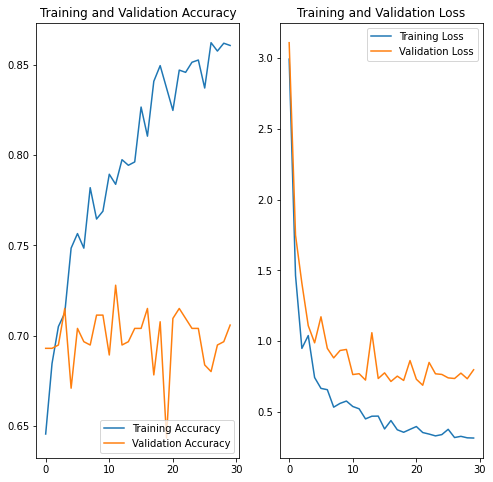

In [64]:
number_of_epochs_it_ran = len(history_pn_mobilenet_aug.history['loss'])

acc = history_pn_mobilenet_aug.history['accuracy']
val_acc = history_pn_mobilenet_aug.history['val_accuracy']

loss = history_pn_mobilenet_aug.history['loss']
val_loss = history_pn_mobilenet_aug.history['val_loss']

epochs_range = range(number_of_epochs_it_ran)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
from google.colab import files
#images_dir = '/content/gdrive/MyDrive/DL'
plt.savefig("Positive_Negative_Binary_Model_Plots.png", bbox_inches='tight', dpi = 250)
files.download("Positive_Negative_Binary_Model_Plots.png") 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 432x288 with 0 Axes>

In [68]:
mean_val_acc = sum(val_acc)/len(val_acc)
mean_val_acc

0.6983455836772918

Well, that brought the validation accuracy up from 0.63 to 0.70; so that's something. 

### 3. Transfer Learning + Data Augmentation + Less Complex with more Dropouts + Regularization


Make it less complex and try more dropouts. 

In [107]:
datagen = ImageDataGenerator(
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        rescale=1./255,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest')

train_generator=datagen.flow_from_dataframe(
                                        dataframe = pos_neg_df[:val_set_start],
                                        x_col = "path",
                                        y_col = "emotion",
                                        batch_size = 32,
                                        interpolation = 'bilinear',
                                        seed = 42,
                                        shuffle = True,
                                        class_mode = "binary",
                                        target_size = (img_height, img_width))

valid_generator=test_datagen.flow_from_dataframe(
                                            dataframe = pos_neg_df[(val_set_start):(test_set_start)],
                                            x_col = "path",
                                            y_col = "emotion",
                                            batch_size = 32,
                                            interpolation = 'bilinear',
                                            seed = 42,
                                            shuffle = False,
                                            class_mode = "binary",
                                            target_size = (img_height, img_width))

test_generator=test_datagen.flow_from_dataframe(
                                            dataframe = pos_neg_df[test_set_start:],
                                            x_col = "path",
                                            y_col = "emotion",
                                            batch_size = 32,
                                            interpolation = 'bilinear',
                                            seed = 42,
                                            shuffle = False,
                                            class_mode = "binary",
                                            target_size = (img_height, img_width))

Found 1646 validated image filenames belonging to 2 classes.
Found 549 validated image filenames belonging to 2 classes.
Found 549 validated image filenames belonging to 2 classes.


In [108]:
base_model = mobilenet_v2.MobileNetV2\
                (weights='imagenet', include_top=False, input_shape=(img_height, img_width,3)) 

for layer in base_model.layers:
    layer.trainable = False   

In [115]:
L2 = 50
DROP = 0.2

x = base_model.output
x = Flatten()(x) 
x = Dense(512, activation='relu', kernel_regularizer=regularizers.l2(L2))(x) 
x = Dropout(DROP)(x)
x = Dense(200, activation='relu', kernel_regularizer=regularizers.l2(L2))(x)
x = Dropout(DROP)(x)
x = Dense(300, activation='relu', kernel_regularizer=regularizers.l2(L2))(x)
x = Dropout(DROP)(x)
x = Dense(50, activation='relu', kernel_regularizer=regularizers.l2(L2))(x)
x = Dropout(DROP)(x)
x = Dense(50, activation='relu', kernel_regularizer=regularizers.l2(L2))(x) 
x = Dropout(DROP)(x)
predictions = Dense(1, activation='sigmoid')(x) 


model_pn_mobilenet_dropout_more_layers = Model(inputs=base_model.input, outputs=predictions)

model_pn_mobilenet_dropout_more_layers.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model_pn_mobilenet_dropout_more_layers.summary()


Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 180, 180, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 90, 90, 32)   864         ['input_4[0][0]']                
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 90, 90, 32)   128         ['Conv1[0][0]']                  
                                                                                                  
 Conv1_relu (ReLU)              (None, 90, 90, 32)   0           ['bn_Conv1[0][0]']         

In [116]:
lr = (ReduceLROnPlateau(factor=.5, patience=3, verbose=1))
es = (EarlyStopping(verbose=1, patience = 8, restore_best_weights=True))

history_pn_mobilenet_dropout_more_layers = model_pn_mobilenet_dropout_more_layers.fit(train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=epochs,
                    # callbacks = es
                    callbacks = [es, lr]
)


# TAKING OUT THE FOLLOWING FROM LAST MODEL IN EARLYSTOPPING: 
# monitor='val_loss', mode='min', 

Epoch 1/100
51/51 [==============================] - 78s 1s/step - loss: 21477.2109 - accuracy: 0.7175 - val_loss: 6695.6025 - val_accuracy: 0.6912 - lr: 0.0010
Epoch 2/100
51/51 [==============================] - 72s 1s/step - loss: 3263.0483 - accuracy: 0.7162 - val_loss: 1315.0470 - val_accuracy: 0.6912 - lr: 0.0010
Epoch 3/100
51/51 [==============================] - 73s 1s/step - loss: 731.0414 - accuracy: 0.7181 - val_loss: 369.9435 - val_accuracy: 0.6893 - lr: 0.0010
Epoch 4/100
51/51 [==============================] - 73s 1s/step - loss: 234.5364 - accuracy: 0.7162 - val_loss: 138.9190 - val_accuracy: 0.6912 - lr: 0.0010
Epoch 5/100
51/51 [==============================] - 73s 1s/step - loss: 91.6436 - accuracy: 0.7169 - val_loss: 55.5075 - val_accuracy: 0.6875 - lr: 0.0010
Epoch 6/100
51/51 [==============================] - 73s 1s/step - loss: 36.4767 - accuracy: 0.7144 - val_loss: 21.5352 - val_accuracy: 0.6912 - lr: 0.0010
Epoch 7/100
51/51 [==============================] 

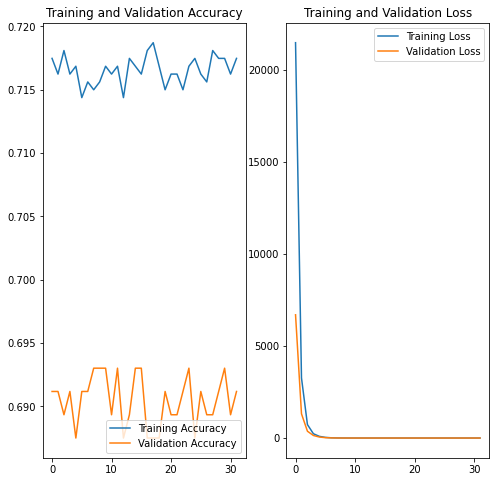

In [117]:
number_of_epochs_it_ran = len(history_pn_mobilenet_dropout_more_layers.history['loss'])

acc = history_pn_mobilenet_dropout_more_layers.history['accuracy']
val_acc = history_pn_mobilenet_dropout_more_layers.history['val_accuracy']

loss = history_pn_mobilenet_dropout_more_layers.history['loss']
val_loss = history_pn_mobilenet_dropout_more_layers.history['val_loss']

epochs_range = range(number_of_epochs_it_ran)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [118]:
mean_val_acc = sum(val_acc)/len(val_acc)
mean_val_acc

0.6904871203005314

That definitely wasn't an improvement over the last one :(

### 4. Using Convolutions

Let's return to no transfer learning but more convolutions. 

In [131]:
model_pn_simple_cnn = Sequential()


model_pn_simple_cnn.add(Conv2D(32, (3, 3), padding='same',
                 input_shape=(img_height, img_width,3)))
model_pn_simple_cnn.add(Activation('relu'))

model_pn_simple_cnn.add(Conv2D(32, (3, 3)))
model_pn_simple_cnn.add(Activation('relu'))
model_pn_simple_cnn.add(MaxPool2D(pool_size=(2, 2)))
model_pn_simple_cnn.add(Dropout(0.25))

model_pn_simple_cnn.add(Conv2D(64, (3, 3), padding='same'))
model_pn_simple_cnn.add(Activation('relu'))

model_pn_simple_cnn.add(Conv2D(64, (3, 3)))
model_pn_simple_cnn.add(Activation('relu'))
model_pn_simple_cnn.add(MaxPool2D(pool_size=(2, 2)))
model_pn_simple_cnn.add(Dropout(0.25))

model_pn_simple_cnn.add(Flatten())
model_pn_simple_cnn.add(Dense(512))
model_pn_simple_cnn.add(Activation('relu'))
model_pn_simple_cnn.add(Dropout(0.5))

model_pn_simple_cnn.add(Dense(1, activation='sigmoid'))

In [132]:
model_pn_simple_cnn.compile(optimizer='adam',loss="binary_crossentropy",metrics=["accuracy"])
model_pn_simple_cnn.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 180, 180, 32)      896       
                                                                 
 activation_5 (Activation)   (None, 180, 180, 32)      0         
                                                                 
 conv2d_5 (Conv2D)           (None, 178, 178, 32)      9248      
                                                                 
 activation_6 (Activation)   (None, 178, 178, 32)      0         
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 89, 89, 32)       0         
 2D)                                                             
                                                                 
 dropout_18 (Dropout)        (None, 89, 89, 32)        0         
                                                      

In [133]:
STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
STEP_SIZE_VALID=valid_generator.n//valid_generator.batch_size
STEP_SIZE_TEST=test_generator.n//test_generator.batch_size

In [134]:
history_pn_simple_cn = model_pn_simple_cnn.fit(train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=epochs,
                    callbacks = EarlyStopping(monitor='val_loss', \
                                              mode='min', verbose=1, patience = 8,\
                                             restore_best_weights=True)
)

Epoch 1/100
51/51 [==============================] - 75s 1s/step - loss: 0.7693 - accuracy: 0.6995 - val_loss: 0.6684 - val_accuracy: 0.6893
Epoch 2/100
51/51 [==============================] - 74s 1s/step - loss: 0.5938 - accuracy: 0.7187 - val_loss: 0.6111 - val_accuracy: 0.6912
Epoch 3/100
51/51 [==============================] - 72s 1s/step - loss: 0.5935 - accuracy: 0.7175 - val_loss: 0.6525 - val_accuracy: 0.6893
Epoch 4/100
51/51 [==============================] - 73s 1s/step - loss: 0.6142 - accuracy: 0.7181 - val_loss: 0.6201 - val_accuracy: 0.6893
Epoch 5/100
51/51 [==============================] - 73s 1s/step - loss: 0.5960 - accuracy: 0.7156 - val_loss: 0.6088 - val_accuracy: 0.6930
Epoch 6/100
51/51 [==============================] - 73s 1s/step - loss: 0.5864 - accuracy: 0.7169 - val_loss: 0.6176 - val_accuracy: 0.6875
Epoch 7/100
51/51 [==============================] - 73s 1s/step - loss: 0.5800 - accuracy: 0.7200 - val_loss: 0.6151 - val_accuracy: 0.6875
Epoch 8/100
5

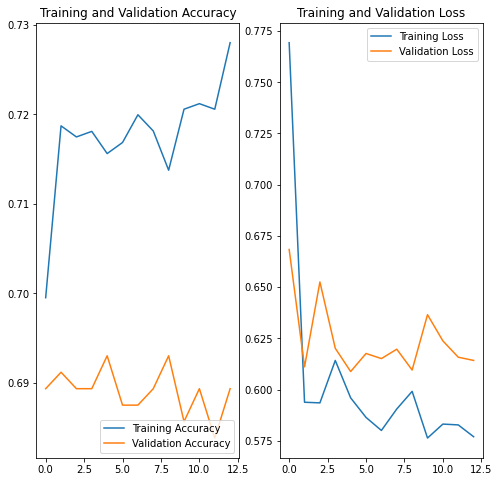

In [135]:
number_of_epochs_it_ran = len(history_pn_simple_cn.history['loss'])

acc = history_pn_simple_cn.history['accuracy']
val_acc = history_pn_simple_cn.history['val_accuracy']

loss = history_pn_simple_cn.history['loss']
val_loss = history_pn_simple_cn.history['val_loss']

epochs_range = range(number_of_epochs_it_ran)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [136]:
mean_val_acc = sum(val_acc)/len(val_acc)
mean_val_acc

0.6890554153002225

OK, this one actually is not that bad; let's give this idea one more stretch.

### 5. Data Augmentation + CNN's

One last try with data augmentation + CNN's. 

In [137]:
train_generator.reset()
valid_generator.reset()
test_generator.reset()

In [139]:
data_augmentation = Sequential(
  [
    layers.RandomFlip("horizontal",
                      input_shape=(img_height,
                                  img_width,
                                  3)),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
  ]
)

In [140]:
model_pn_aug_cnn = Sequential([
    data_augmentation, 
    layers.Conv2D(32, (3, 3), padding='same', activation = 'relu'), 
    layers.MaxPooling2D(pool_size=(2, 2)), 
    
    layers.Conv2D(64, (3, 3), padding='same', activation = 'relu'), 
    layers.MaxPooling2D(pool_size=(2, 2)), 
    layers.Dropout(0.25), 

    layers.Conv2D(64, (3, 3), padding='same', activation = 'relu'), 
    layers.MaxPooling2D(pool_size=(2, 2)), 

    layers.Conv2D(64, (3, 3), padding='same', activation = 'relu'), 
    layers.MaxPooling2D(pool_size=(2, 2)), 
    layers.Dropout(0.25), 
    layers.Flatten(),
    layers.Dense(512, activation = 'relu'), 
    layers.Dropout(0.5), 
    layers.Dense(1, activation='sigmoid')])

In [141]:
model_pn_aug_cnn.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])
model_pn_aug_cnn.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_4 (Sequential)   (None, 180, 180, 3)       0         
                                                                 
 conv2d_8 (Conv2D)           (None, 180, 180, 32)      896       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 90, 90, 32)       0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 90, 90, 64)        18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 45, 45, 64)       0         
 2D)                                                             
                                                                 
 dropout_21 (Dropout)        (None, 45, 45, 64)       

In [142]:
history_pn_aug_cnn = model_pn_aug_cnn.fit(train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    validation_data=valid_generator,
                    validation_steps=STEP_SIZE_VALID,
                    epochs=epochs,
                    callbacks = EarlyStopping(monitor='val_loss', \
                                              mode='min', verbose=1, patience = 4,\
                                             restore_best_weights=True)
)

Epoch 1/100
51/51 [==============================] - 75s 1s/step - loss: 0.6059 - accuracy: 0.7100 - val_loss: 0.6164 - val_accuracy: 0.6912
Epoch 2/100
51/51 [==============================] - 73s 1s/step - loss: 0.6179 - accuracy: 0.7175 - val_loss: 0.6225 - val_accuracy: 0.6930
Epoch 3/100
51/51 [==============================] - 72s 1s/step - loss: 0.5975 - accuracy: 0.7169 - val_loss: 0.6157 - val_accuracy: 0.6912
Epoch 4/100
51/51 [==============================] - 73s 1s/step - loss: 0.6001 - accuracy: 0.7156 - val_loss: 0.6211 - val_accuracy: 0.6912
Epoch 5/100
51/51 [==============================] - 73s 1s/step - loss: 0.6017 - accuracy: 0.7169 - val_loss: 0.6206 - val_accuracy: 0.6893
Epoch 6/100
51/51 [==============================] - 73s 1s/step - loss: 0.5941 - accuracy: 0.7187 - val_loss: 0.6167 - val_accuracy: 0.6912
Epoch 7/100
51/51 [==============================] - 73s 1s/step - loss: 0.5881 - accuracy: 0.7150 - val_loss: 0.6127 - val_accuracy: 0.6893
Epoch 8/100
5

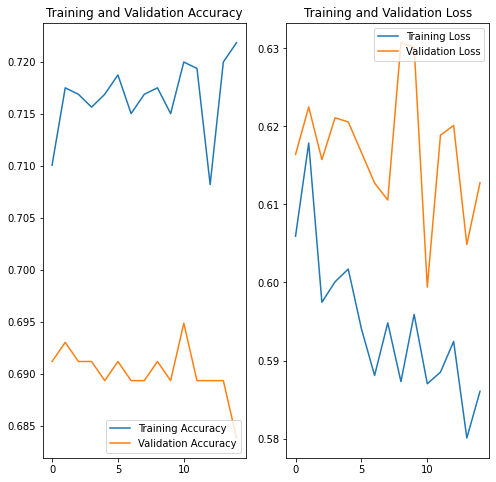

In [143]:
number_of_epochs_it_ran = len(history_pn_aug_cnn.history['loss'])

acc = history_pn_aug_cnn.history['accuracy']
val_acc = history_pn_aug_cnn.history['val_accuracy']

loss = history_pn_aug_cnn.history['loss']
val_loss = history_pn_aug_cnn.history['val_loss']

epochs_range = range(number_of_epochs_it_ran)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [144]:
mean_val_acc = sum(val_acc)/len(val_acc)
mean_val_acc

0.6901960651079814

Still Model #2 takes the cake. 

## Prediction & Evaluations

In [91]:
# import libraries for prediction/ evaluation & visualization
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import precision_score, recall_score, accuracy_score, precision_recall_curve, roc_curve, roc_auc_score

import seaborn as sns
import matplotlib.pyplot as plt

from tensorflow.keras.utils import load_img, img_to_array
from tensorflow import expand_dims
from tensorflow.keras.models import load_model

### Predict

In [ ]:
MODEL_PATH = "drive/MyDrive/DL/model_postive_negative_binary.h5"
model_pn_mobilenet_aug = load_model(MODEL_PATH)


In [72]:
predictions = model_pn_mobilenet_aug.predict(test_generator)

In [73]:
class_names = test_generator.class_indices
print(class_names)
class_names_list = list(class_names.keys())

{'negative': 0, 'positive': 1}


In [74]:
predictions_mapped = [0 if pred <0.5 else 1 for pred in predictions]
y_ground_truth = test_generator.labels

In [75]:
predicted_emotions = [class_names_list[k] for k in predictions_mapped]
print(predicted_emotions)

['negative', 'positive', 'positive', 'positive', 'positive', 'positive', 'positive', 'positive', 'negative', 'negative', 'positive', 'positive', 'negative', 'positive', 'positive', 'positive', 'positive', 'positive', 'positive', 'negative', 'positive', 'negative', 'positive', 'positive', 'negative', 'positive', 'positive', 'positive', 'positive', 'positive', 'positive', 'positive', 'negative', 'positive', 'positive', 'positive', 'positive', 'positive', 'positive', 'positive', 'negative', 'positive', 'negative', 'positive', 'positive', 'positive', 'positive', 'positive', 'positive', 'positive', 'positive', 'positive', 'positive', 'positive', 'negative', 'positive', 'positive', 'positive', 'positive', 'positive', 'positive', 'negative', 'positive', 'negative', 'negative', 'positive', 'positive', 'positive', 'positive', 'positive', 'positive', 'positive', 'positive', 'positive', 'negative', 'positive', 'positive', 'negative', 'positive', 'positive', 'positive', 'positive', 'negative', 'ne

### Evaluate

In [76]:
model_pn_mobilenet_aug.evaluate(test_generator)

18/18 [==============================] - 14s 753ms/step - loss: 0.6031 - accuracy: 0.7195


[0.6031491160392761, 0.7194899916648865]

In [79]:
confusion = confusion_matrix(y_ground_truth, predictions_mapped)
confusion

array([[ 29, 125],
       [ 93, 302]])

Text(0.5, 1.0, 'Confusion Matrix')

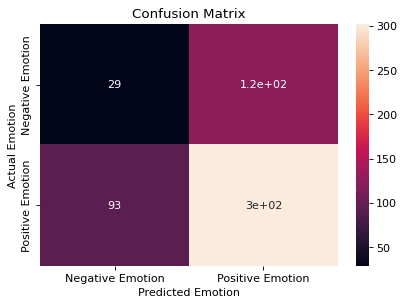

In [82]:
confusion_binary = plt.figure(dpi=80)
sns.heatmap(confusion, annot=True, \
            xticklabels=['Negative Emotion', 'Positive Emotion'], yticklabels=['Negative Emotion', 'Positive Emotion'])
cmlabels = ['True Negatives', "False Positives",
               'Flase Negatives', "True Positives"]
plt.xlabel('Predicted Emotion')
plt.ylabel('Actual Emotion')
plt.title('Confusion Matrix')
confusion_binary.savefig("Confusion Matrix for Binary.png", bbox_inches='tight');
files.download("Confusion Matrix for Binary.png") 

In [84]:
print(classification_report(y_ground_truth, predictions_mapped))

              precision    recall  f1-score   support

           0       0.24      0.19      0.21       154
           1       0.71      0.76      0.73       395

    accuracy                           0.60       549
   macro avg       0.47      0.48      0.47       549
weighted avg       0.58      0.60      0.59       549



In [85]:
precision_curve, recall_curve, threshold_curve = precision_recall_curve(y_ground_truth, predictions_mapped)

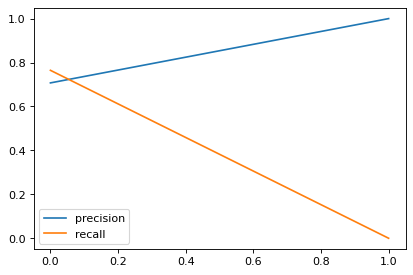

In [86]:
plt.figure(dpi=80)
plt.plot(threshold_curve, precision_curve[1:],label='precision')
plt.plot(threshold_curve, recall_curve[1:], label='recall')
plt.legend(loc='lower left')
# plt.xlabel('Threshold (above this probability, label as highlight-possible)');
# plt.title('Precision and Recall Curves for Modern Met')
# plt.savefig("Precision and Recall Curves for Modern Met.png", bbox_inches='tight');

ROC AUC score =  0.47643432516850237


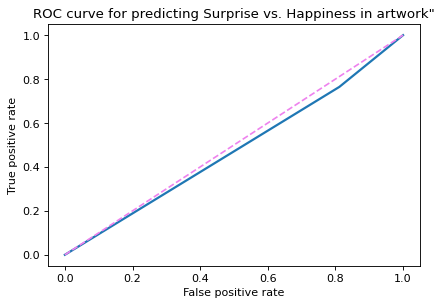

In [88]:
fpr, tpr, thresholds = roc_curve(y_ground_truth, predictions_mapped)
plt.figure(dpi=80)

plt.plot(fpr, tpr,lw=2)
plt.plot([0,1],[0,1],c='violet',ls='--')
plt.xlim([-0.05,1.05])
plt.ylim([-0.05,1.05])

plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve for predicting Surprise vs. Happiness in artwork"')
# plt.savefig("ROC curve for predicting Surprise vs. Happiness in emotion.png", bbox_inches='tight')
# files.download("ROC curve for predicting Surprise vs. Happiness in emotion.png") 
print("ROC AUC score = ", roc_auc_score(y_ground_truth, predictions_mapped))

### Testing an image

Test an image for detection of emotion

In [93]:
orozco_path = "drive/MyDrive/DL/1024px-Orozco_Mural_Omniciencia_1925_Azulejos.jpg"

img = load_img(orozco_path, target_size=(img_height, img_width))
img_array = img_to_array(img)
img_array = expand_dims(img_array, 0) 

pred = model_pn_mobilenet_aug.predict(img_array)
pred_mapped = (0 if pred <0.5 else 1)
predicted_emotion = class_names_list[pred_mapped]

accuracy = model_pn_mobilenet_aug.evaluate(test_generator, verbose = 0)[1]
print("This image most likely evokes {} emotions with a {:.2f} percent accuracy."
    .format(predicted_emotion, 100 * accuracy))

This image most likely evokes positive with a 71.95 percent accuracy.


In [94]:
def which_emotion(image_path): 
  img = load_img(image_path, target_size=(img_height, img_width))
  img_array = img_to_array(img)
  img_array = expand_dims(img_array, 0) 

  pred = model_pn_mobilenet_aug.predict(img_array)
  pred_mapped = (0 if pred <0.5 else 1)
  predicted_emotion = class_names_list[pred_mapped]

  accuracy = model_pn_mobilenet_aug.evaluate(test_generator, verbose = 0)[1]
  print("This image most likely evokes {} emotions with a {:.2f} percent accuracy."
      .format(predicted_emotion, 100 * accuracy))

In [95]:
which_emotion(orozco_path)

This image most likely evokes positive with a 71.95 percent accuracy.


### Figure out Wrong Predictions

In [96]:
path_names = test_generator.filenames
idx = test_generator.index_array

In [99]:
predictions_dict = {"index": idx, "path_names": path_names, "actual_emotion": y_ground_truth, "predicted_emotion": predicted_emotions}
predictions_df = pd.DataFrame(predictions_dict)
predictions_df.head(3)

,index,path_names,actual_emotion,predicted_emotion
0,275,drive/MyDrive/DL/dataset_images/577284fbedc2cb...,0,negative
1,535,drive/MyDrive/DL/dataset_images/5772731fedc2cb...,1,positive
2,179,drive/MyDrive/DL/dataset_images/57726f46edc2cb...,0,positive


In [100]:
predictions_df.actual_emotion = predictions_df.actual_emotion.apply(lambda x: "negative" if (x ==0) else "positive" )
predictions_df.head(3)

,index,path_names,actual_emotion,predicted_emotion
0,275,drive/MyDrive/DL/dataset_images/577284fbedc2cb...,negative,negative
1,535,drive/MyDrive/DL/dataset_images/5772731fedc2cb...,positive,positive
2,179,drive/MyDrive/DL/dataset_images/57726f46edc2cb...,negative,positive


In [101]:
wrong_predictions = (predictions_df[predictions_df.actual_emotion != predictions_df.predicted_emotion])
wrong_predictions

,index,path_names,actual_emotion,predicted_emotion
2,179,drive/MyDrive/DL/dataset_images/57726f46edc2cb...,negative,positive
7,449,drive/MyDrive/DL/dataset_images/57726e40edc2cb...,negative,positive
8,21,drive/MyDrive/DL/dataset_images/59928c32edc2c9...,positive,negative
9,398,drive/MyDrive/DL/dataset_images/57728650edc2cb...,positive,negative
11,27,drive/MyDrive/DL/dataset_images/57726ff9edc2cb...,negative,positive
...,...,...,...,...
543,545,drive/MyDrive/DL/dataset_images/57727019edc2cb...,positive,negative
544,533,drive/MyDrive/DL/dataset_images/577281c3edc2cb...,positive,negative
545,446,drive/MyDrive/DL/dataset_images/577280fcedc2cb...,negative,positive
546,252,drive/MyDrive/DL/dataset_images/57728001edc2cb...,negative,positive


Predicted: negative. Got: positive.


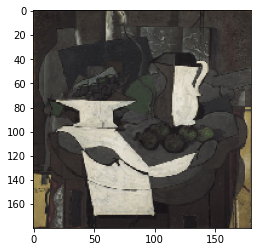

In [102]:
img = load_img(wrong_predictions.iloc[0, 1], target_size=(img_height, img_width))
plt.imshow(img)
print(f"Predicted: {wrong_predictions.iloc[0, 2]}. Got: {wrong_predictions.iloc[0, 3]}.")

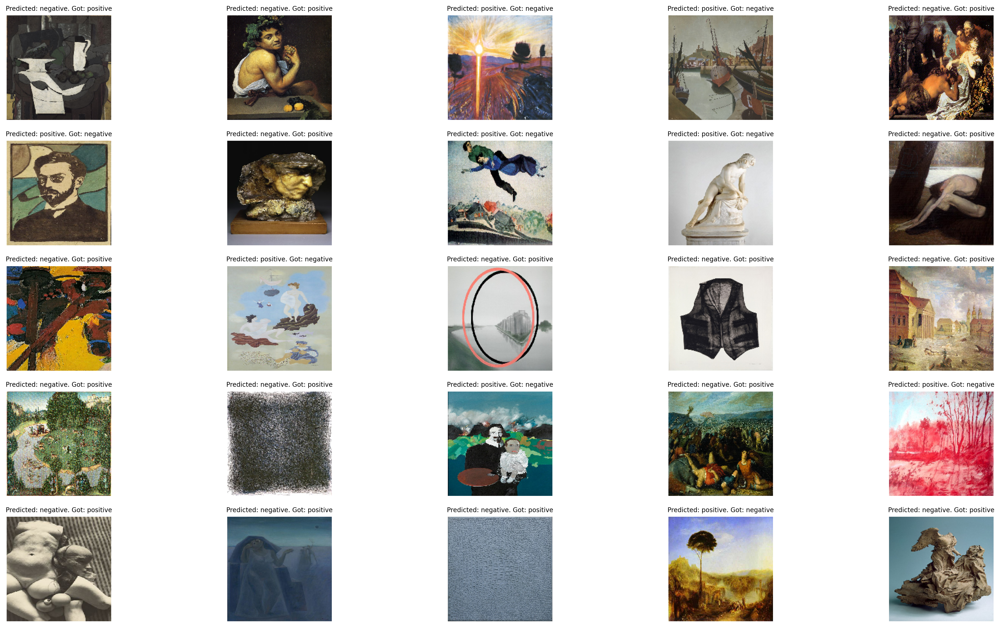

In [105]:
images_plt = plt.figure(figsize=(24, 14), dpi=250)
for i in range(25): 
  ax = plt.subplot(5, 5, i + 1)
  img = load_img(wrong_predictions.iloc[i, 1], target_size=(img_height, img_width))
  plt.imshow(img)
  plt.title('Predicted: {0}. Got: {1}'.format(wrong_predictions.iloc[i, 2], wrong_predictions.iloc[i, 3]), fontsize = 8)
  plt.axis("off")

images_plt.show()

In [ ]:
from google.colab import files
#images_dir = '/content/gdrive/MyDrive/DL'
images_plt.savefig("Binary_Model_Plots.png", bbox_inches='tight', dpi = 250)
files.download("Binary_Model_Plots.png") 